In [ ]:
import librosa
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import soundfile as sf
from beat_this.inference import File2Beats
from IPython.display import Audio, display

In [ ]:
# Paths
BRID_AUDIO_PATH = "../brid/"
BRID_BEATS_PATH = "../data/annotations/brid/annotations/beats/"


class BeatProcessor:
    def __init__(self):
        self.sources = {
            "annotations": "Ground Truth",
            "candombe_finetune": "Candombe Model",
            "final0": "Final Model",
        }

    def extract_beats_from_annotations(self, file_name):
        """Extract beats and downbeats from annotation files."""
        beats_file = BRID_BEATS_PATH + file_name.split(".")[0] + ".beats"

        beat_times, beat_numbers = [], []
        with open(beats_file, "r") as f:
            for line in f:
                time, number = line.strip().split("\t")
                beat_times.append(float(time))
                beat_numbers.append(int(number))

        downbeats = [beat_times[i] for i, n in enumerate(beat_numbers) if n == 1]
        regular_beats = [beat_times[i] for i, n in enumerate(beat_numbers) if n != 1]

        return regular_beats, downbeats

    def extract_beats_from_model(self, audio_path, checkpoint_path):
        """Extract beats and downbeats from model predictions."""
        full_audio_path = BRID_AUDIO_PATH + audio_path
        file2beats = File2Beats(checkpoint_path=checkpoint_path, dbn=False)
        all_beats, downbeats = file2beats(full_audio_path)
        regular_beats = [b for b in all_beats if b not in downbeats]

        return regular_beats, downbeats

    def load_audio(self, file_name):
        """Load and prepare audio file."""
        audio_path = BRID_AUDIO_PATH + file_name
        audio, sr = sf.read(audio_path)

        # Convert to mono if stereo
        if len(audio.shape) > 1:
            audio = np.mean(audio, axis=1)

        return audio, sr, audio_path

    def create_sonification(self, audio, sr, beats, downbeats):
        """Create audio with beat and downbeat click tracks."""
        beat_clicks = librosa.clicks(
            times=beats, sr=sr, click_freq=1000, length=len(audio)
        )
        downbeat_clicks = librosa.clicks(
            times=downbeats, sr=sr, click_freq=1500, length=len(audio)
        )

        return Audio(audio + 0.5 * (beat_clicks + downbeat_clicks), rate=sr)

    def plot_beats(self, audio, sr, beats, downbeats, title):
        """Create a visualization of the audio waveform with beat markers."""
        # Create a time array for plotting
        times = np.arange(len(audio)) / sr

        # Create the plot
        plt.figure(figsize=(12, 4))

        # Plot the waveform
        plt.plot(times, audio, color="gray", alpha=0.5)

        # Plot the beats and downbeats as vertical lines
        for beat in beats:
            plt.axvline(x=beat, color="green", alpha=0.7, linewidth=1)

        for downbeat in downbeats:
            plt.axvline(x=downbeat, color="red", alpha=0.7, linewidth=2)

        # Add a legend
        plt.plot([], [], color="green", label="Beat")
        plt.plot([], [], color="red", label="Downbeat")

        # Set plot properties
        plt.title(title)
        plt.xlabel("Time (s)")
        plt.ylabel("Amplitude")
        plt.grid(True, alpha=0.3)
        plt.legend()

        # Limit x-axis to make the visualization clearer (first 30 seconds)
        plt.xlim(0, min(30, times[-1]))

        plt.tight_layout()
        plt.show()

    def process_file(self, file_name, plot=True, sonify=True):
        """Process a file with all beat sources (annotations and models)."""
        # Load audio once
        audio, sr, audio_path = self.load_audio(file_name)

        # Process annotations
        try:
            beats_anno, downbeats_anno = self.extract_beats_from_annotations(file_name)
            if plot:
                self.plot_beats(
                    audio,
                    sr,
                    beats_anno,
                    downbeats_anno,
                    "Beats & Downbeats: Ground Truth",
                )
            if sonify:
                print("Ground Truth Sonification:")
                display(self.create_sonification(audio, sr, beats_anno, downbeats_anno))
        except Exception as e:
            print(f"Could not process annotations: {e}")

        # Process model predictions
        for model_name, model_display_name in [
            ("candombe_finetune", "Candombe Model"),
            ("final0", "Final Model"),
        ]:
            try:
                checkpoint_path = f"../{model_name}.ckpt"
                beats_model, downbeats_model = self.extract_beats_from_model(
                    file_name, checkpoint_path
                )

                if plot:
                    self.plot_beats(
                        audio,
                        sr,
                        beats_model,
                        downbeats_model,
                        f"Beats & Downbeats: {model_display_name}",
                    )

                if sonify:
                    print(f"{model_display_name} Sonification:")
                    display(
                        self.create_sonification(
                            audio, sr, beats_model, downbeats_model
                        )
                    )
            except Exception as e:
                print(f"Could not process {model_display_name}: {e}")


def process_song(file_name, plot=True, sonify=True):
    """Wrapper function for easy processing of a single song."""
    processor = BeatProcessor()
    processor.process_file(file_name, plot=plot, sonify=sonify)


processor = BeatProcessor()

In [28]:
skip_that_brid = (
    "../skip-that-results/skip_that_candombe_finetune_on_brid_metrics_log.csv"
)
skip_that_gtzan = (
    "../skip-that-results/skip_that_candombe_finetune_on_gtzan_metrics_log.csv"
)
final_brid = "../skip-that-results/final_on_brid_metrics_log.csv"
final_gtzan = "../skip-that-results/final-model-track-metrics.csv"

df_skip_that_brid = pd.read_csv(skip_that_brid)
df_skip_that_gtzan = pd.read_csv(skip_that_gtzan)
df_final_brid = pd.read_csv(final_brid)
df_final_gtzan = pd.read_csv(final_gtzan)

In [ ]:
def compare_models_on_dataset(
    df1, df2, model1_name="Skip That", model2_name="Final", metrics=None
):
    """
    Compare two models' performance on the same dataset.

    Args:
        df1: DataFrame for first model
        df2: DataFrame for second model
        model1_name: Name of the first model for display
        model2_name: Name of the second model for display
        metrics: List of metrics to compare (defaults to all F-measure metrics)

    Returns:
        DataFrame with differences and sorted results
    """
    if metrics is None:
        metrics = ["F-measure_beat", "F-measure_downbeat"]

    # Ensure we're working with copies to avoid modifying the originals
    df1 = df1.copy()
    df2 = df2.copy()

    # Add model name suffix to columns to avoid confusion after merge
    for metric in metrics:
        df1.rename(columns={metric: f"{metric}_{model1_name}"}, inplace=True)
        df2.rename(columns={metric: f"{metric}_{model2_name}"}, inplace=True)

    # Merge the dataframes on 'Piece' column
    merged_df = pd.merge(
        df1, df2, on="Piece", suffixes=("_" + model1_name, "_" + model2_name)
    )

    # Calculate differences (model1 - model2)
    for metric in metrics:
        diff_col = f"{metric}_diff"
        merged_df[diff_col] = (
            merged_df[f"{metric}_{model1_name}"] - merged_df[f"{metric}_{model2_name}"]
        )

        # Add columns for improved, worsened, and no change categories
        merged_df[f"{metric}_improved"] = merged_df[diff_col] > 0
        merged_df[f"{metric}_worsened"] = merged_df[diff_col] < 0
        merged_df[f"{metric}_no_change"] = merged_df[diff_col] == 0

    # Calculate overall improvement across metrics
    if len(metrics) > 1:
        # Average difference across all metrics
        merged_df["overall_diff"] = merged_df[
            [f"{metric}_diff" for metric in metrics]
        ].mean(axis=1)
        merged_df["overall_improved"] = merged_df["overall_diff"] > 0
        merged_df["overall_worsened"] = merged_df["overall_diff"] < 0
        merged_df["overall_no_change"] = merged_df["overall_diff"] == 0
    else:
        # If only one metric, use that as the overall
        metric = metrics[0]
        merged_df["overall_diff"] = merged_df[f"{metric}_diff"]
        merged_df["overall_improved"] = merged_df[f"{metric}_improved"]
        merged_df["overall_worsened"] = merged_df[f"{metric}_worsened"]
        merged_df["overall_no_change"] = merged_df[f"{metric}_no_change"]

    return merged_df


def plot_improvement_distributions(
    comparison_df,
    metrics=None,
    figsize=(14, 8),
    model1_name="Model1",
    model2_name="Model2",
):
    """
    Create histograms showing the distribution of improvements and deteriorations.

    Args:
        comparison_df: DataFrame with comparison results
        metrics: List of metrics to plot
        figsize: Size of the figure
        model1_name: Name of the first model for display
        model2_name: Name of the second model for display
    """
    if metrics is None:
        metrics = ["F-measure_beat", "F-measure_downbeat"]

    n_metrics = len(metrics)
    fig, axes = plt.subplots(n_metrics, 1, figsize=figsize)

    # If only one metric, axes is not a list, so we need to convert it
    if n_metrics == 1:
        axes = [axes]

    for i, metric in enumerate(metrics):
        diff_col = f"{metric}_diff"
        improved = comparison_df[comparison_df[diff_col] > 0]
        worsened = comparison_df[comparison_df[diff_col] < 0]

        ax = axes[i]

        # Plot improvements in green
        if not improved.empty:
            sns.histplot(
                improved[diff_col],
                ax=ax,
                color="green",
                label="Improved",
                alpha=0.7,
                kde=False,
            )

        # Plot deteriorations in red
        if not worsened.empty:
            sns.histplot(
                worsened[diff_col],
                ax=ax,
                color="red",
                label="Worsened",
                alpha=0.7,
                kde=False,
            )

        # Note: We don't plot the 'no change' category as requested

        ax.set_title(f"Distribution of Changes in {metric}")
        ax.set_xlabel(f"Difference ({model1_name} - {model2_name})")
        ax.set_ylabel("Count")
        ax.axvline(x=0, color="black", linestyle="--")
        ax.legend()

    plt.tight_layout()
    plt.show()

    # Also create a 2D scatter plot if there are two metrics
    if len(metrics) == 2:
        plt.figure(figsize=(10, 8))

        # Create color mapping for the scatter plot
        def get_point_color(row):
            if row["overall_no_change"]:
                return "blue"  # No change
            elif row["overall_improved"]:
                return "green"  # Improved
            else:
                return "red"  # Worsened

        scatter = plt.scatter(
            comparison_df[f"{metrics[0]}_diff"],
            comparison_df[f"{metrics[1]}_diff"],
            c=comparison_df.apply(get_point_color, axis=1),
            alpha=0.7,
        )

        plt.axhline(y=0, color="black", linestyle="--", alpha=0.5)
        plt.axvline(x=0, color="black", linestyle="--", alpha=0.5)

        plt.title(f"{metrics[0]} vs {metrics[1]} Improvement")
        plt.xlabel(f"Difference in {metrics[0]}")
        plt.ylabel(f"Difference in {metrics[1]}")

        # Add diagonal reference line (equal improvement in both metrics)
        min_val = min(plt.xlim()[0], plt.ylim()[0])
        max_val = max(plt.xlim()[1], plt.ylim()[1])
        plt.plot([min_val, max_val], [min_val, max_val], "k--", alpha=0.3)

        plt.grid(True, alpha=0.3)

        # Add legend for improved vs worsened vs no change
        from matplotlib.lines import Line2D

        legend_elements = [
            Line2D(
                [0],
                [0],
                marker="o",
                color="w",
                markerfacecolor="green",
                markersize=10,
                label="Improved",
            ),
            Line2D(
                [0],
                [0],
                marker="o",
                color="w",
                markerfacecolor="red",
                markersize=10,
                label="Worsened",
            ),
            Line2D(
                [0],
                [0],
                marker="o",
                color="w",
                markerfacecolor="blue",
                markersize=10,
                label="No Change",
            ),
        ]
        plt.legend(handles=legend_elements)

        plt.tight_layout()
        plt.show()


def print_top_tracks(comparison_df, metric="overall_diff", top_n=5):
    """
    Print the top N most improved and most deteriorated tracks.

    Args:
        comparison_df: DataFrame with comparison results
        metric: Metric to sort by
        top_n: Number of top tracks to display
    """
    # Sort by the specified metric
    sorted_df = comparison_df.sort_values(by=metric, ascending=False)

    print(f"\n===== Top {top_n} Most Improved Tracks =====")
    improved = sorted_df.head(top_n)
    for i, (_, row) in enumerate(improved.iterrows(), 1):
        print(f"{i}. {row['Piece']}: {row[metric]:.4f}")
        # Print the individual metrics if we're looking at overall improvement
        if metric == "overall_diff":
            metrics = [
                col
                for col in sorted_df.columns
                if col.endswith("_diff") and col != "overall_diff"
            ]
            for m in metrics:
                print(f"   - {m}: {row[m]:.4f}")

    print(f"\n===== Top {top_n} Most Deteriorated Tracks =====")
    deteriorated = sorted_df.tail(top_n).iloc[::-1]  # Reverse to show worst first
    for i, (_, row) in enumerate(deteriorated.iterrows(), 1):
        print(f"{i}. {row['Piece']}: {row[metric]:.4f}")
        # Print the individual metrics if we're looking at overall improvement
        if metric == "overall_diff":
            metrics = [
                col
                for col in sorted_df.columns
                if col.endswith("_diff") and col != "overall_diff"
            ]
            for m in metrics:
                print(f"   - {m}: {row[m]:.4f}")

    # Print tracks with no change
    if "overall_no_change" in comparison_df.columns:
        no_change_tracks = comparison_df[comparison_df["overall_no_change"]]
        if len(no_change_tracks) > 0:
            print(f"\n===== Tracks with No Change ({len(no_change_tracks)}) =====")
            for i, (_, row) in enumerate(no_change_tracks.iterrows(), 1):
                print(f"{i}. {row['Piece']}")


def summarize_comparison(comparison_df, metrics=None):
    """
    Provide a summary of the comparison results.

    Args:
        comparison_df: DataFrame with comparison results
        metrics: List of metrics to summarize
    """
    if metrics is None:
        metrics = ["F-measure_beat", "F-measure_downbeat"]

    total_tracks = len(comparison_df)

    print("\n===== Comparison Summary =====")
    print(f"Total tracks analyzed: {total_tracks}")

    for metric in metrics:
        improved_count = comparison_df[comparison_df[f"{metric}_improved"]].shape[0]
        worsened_count = comparison_df[comparison_df[f"{metric}_worsened"]].shape[0]
        no_change_count = comparison_df[comparison_df[f"{metric}_no_change"]].shape[0]

        improved_percent = (improved_count / total_tracks) * 100
        worsened_percent = (worsened_count / total_tracks) * 100
        no_change_percent = (no_change_count / total_tracks) * 100

        avg_improvement = (
            comparison_df[comparison_df[f"{metric}_improved"]][f"{metric}_diff"].mean()
            if improved_count > 0
            else 0
        )
        avg_deterioration = (
            comparison_df[comparison_df[f"{metric}_worsened"]][f"{metric}_diff"].mean()
            if worsened_count > 0
            else 0
        )

        print(f"\n{metric}:")
        print(f"  Improved tracks: {improved_count} ({improved_percent:.1f}%)")
        print(f"  Worsened tracks: {worsened_count} ({worsened_percent:.1f}%)")
        print(f"  Unchanged tracks: {no_change_count} ({no_change_percent:.1f}%)")
        print(f"  Average improvement: {avg_improvement:.4f}")
        print(f"  Average deterioration: {avg_deterioration:.4f}")

    if "overall_improved" in comparison_df.columns:
        overall_improved_count = comparison_df[comparison_df["overall_improved"]].shape[
            0
        ]
        overall_worsened_count = comparison_df[comparison_df["overall_worsened"]].shape[
            0
        ]
        overall_no_change_count = comparison_df[
            comparison_df["overall_no_change"]
        ].shape[0]

        overall_improved_percent = (overall_improved_count / total_tracks) * 100
        overall_worsened_percent = (overall_worsened_count / total_tracks) * 100
        overall_no_change_percent = (overall_no_change_count / total_tracks) * 100

        print(f"\nOverall:")
        print(
            f"  Improved tracks overall: {overall_improved_count} ({overall_improved_percent:.1f}%)"
        )
        print(
            f"  Worsened tracks overall: {overall_worsened_count} ({overall_worsened_percent:.1f}%)"
        )
        print(
            f"  Unchanged tracks overall: {overall_no_change_count} ({overall_no_change_percent:.1f}%)"
        )


def analyze_model_comparison(
    df1,
    df2,
    model1_name="Skip That",
    model2_name="Final",
    metrics=None,
    top_n=5,
    plot=True,
):
    """
    Run a complete analysis comparing two models.

    Args:
        df1: DataFrame for first model
        df2: DataFrame for second model
        model1_name: Name of the first model for display
        model2_name: Name of the second model for display
        metrics: List of metrics to compare
        top_n: Number of top tracks to display
        plot: Whether to generate plots

    Returns:
        The comparison DataFrame for further analysis
    """
    if metrics is None:
        metrics = ["F-measure_beat", "F-measure_downbeat"]

    print(f"Comparing {model1_name} model to {model2_name} model...")

    # Compare the models
    comparison_df = compare_models_on_dataset(
        df1, df2, model1_name, model2_name, metrics
    )

    # Print summary
    summarize_comparison(comparison_df, metrics)

    # Print top tracks for overall difference
    print_top_tracks(comparison_df, "overall_diff", top_n)

    # Optional: Print top tracks for individual metrics if different from overall
    if len(metrics) > 1:  # Only print individual metrics if there's more than one
        for metric in metrics:
            diff_col = f"{metric}_diff"
            print_top_tracks(comparison_df, diff_col, top_n)

    # Plot distributions if requested
    if plot:
        plot_improvement_distributions(
            comparison_df, metrics, model1_name=model1_name, model2_name=model2_name
        )

    return comparison_df

Comparing Fine-tuned model to Beat this! model...

===== Comparison Summary =====
Total tracks analyzed: 93

CMLt_downbeat:
  Improved tracks: 40 (43.0%)
  Worsened tracks: 25 (26.9%)
  Unchanged tracks: 28 (30.1%)
  Average improvement: 0.4967
  Average deterioration: -0.2875

Overall:
  Improved tracks overall: 40 (43.0%)
  Worsened tracks overall: 25 (26.9%)
  Unchanged tracks overall: 28 (30.1%)

===== Top 5 Most Improved Tracks =====
1. brid/[0025] M3-06-PA/track.npy: 1.0000
   - CMLt_downbeat_diff: 1.0000
2. brid/[0059] M2-11-SA/track.npy: 1.0000
   - CMLt_downbeat_diff: 1.0000
3. brid/[0080] M2-32-PA/track.npy: 1.0000
   - CMLt_downbeat_diff: 1.0000
4. brid/[0017] M4-17-PA/track.npy: 1.0000
   - CMLt_downbeat_diff: 1.0000
5. brid/[0083] M2-35-SE/track.npy: 0.9630
   - CMLt_downbeat_diff: 0.9630

===== Top 5 Most Deteriorated Tracks =====
1. brid/[0045] M3-26-SE/track.npy: -1.0000
   - CMLt_downbeat_diff: -1.0000
2. brid/[0030] M3-11-PA/track.npy: -0.9286
   - CMLt_downbeat_diff:

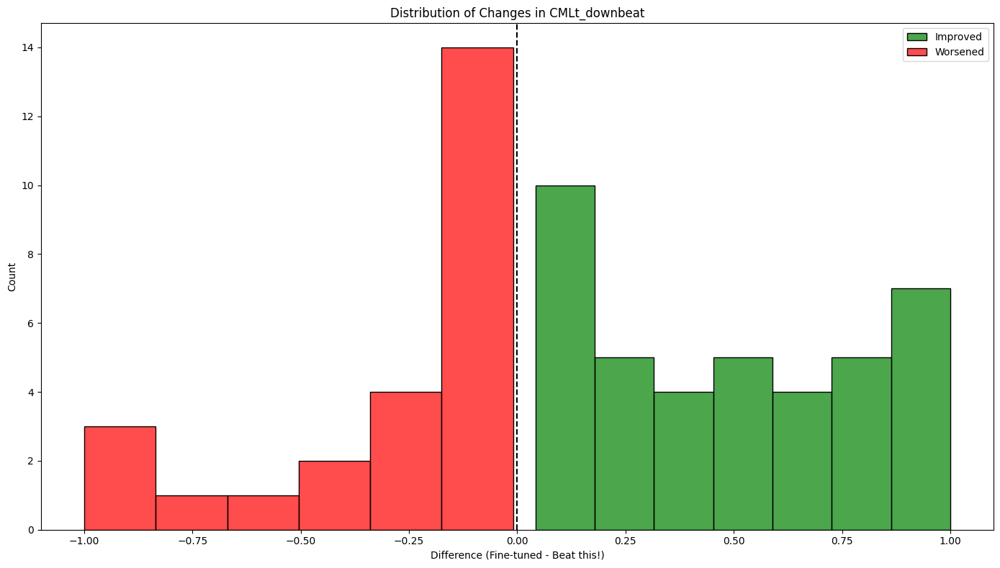

In [106]:
comparison_df = analyze_model_comparison(
    df_skip_that_brid, df_final_brid, "Fine-tuned", "Beat this!", metrics=["CMLt_downbeat"]
)

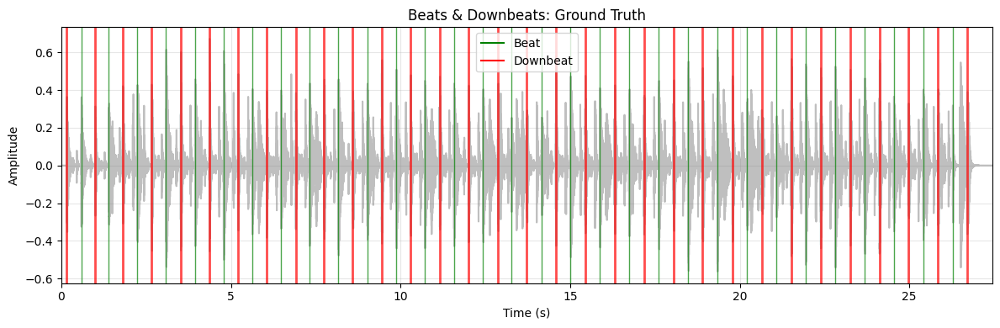

Ground Truth Sonification:


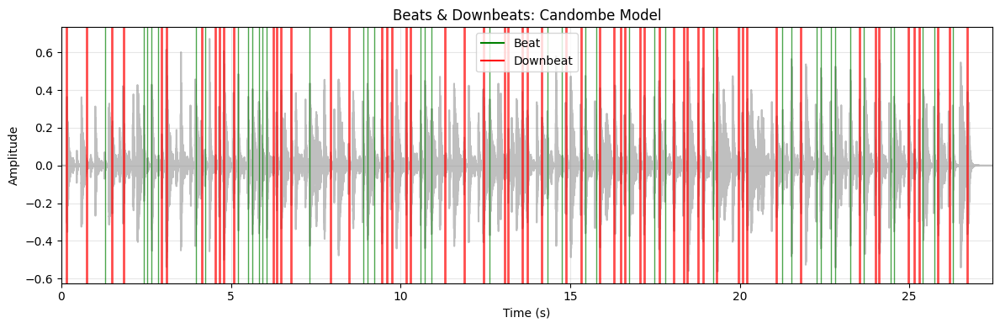

Candombe Model Sonification:


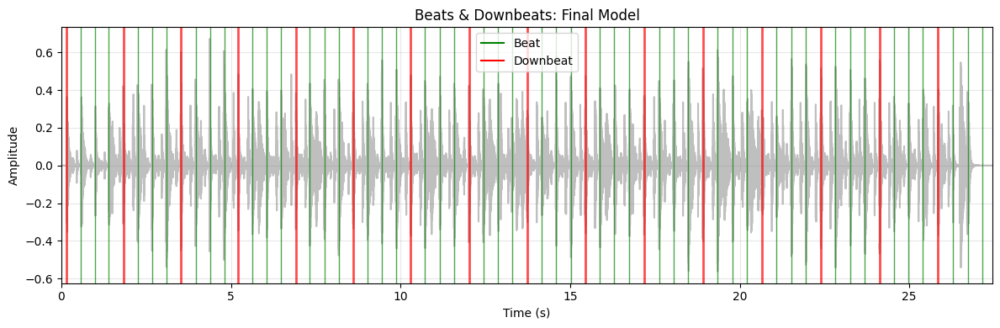

Final Model Sonification:


In [79]:
process_song("[0087] M2-39-SE.wav", plot=True, sonify=True)

In [75]:
# comparison_df[comparison_df["overall_improved"] == False].sort_values("overall_diff", ascending=True)
comparison_df[comparison_df["CMLt_beat_Skip That"] < 0.3].sort_values("overall_diff", ascending=True)

,Piece,Dataset_Skip That,F-measure_beat_Skip That,Cemgil_beat_Skip That,CMLt_beat_Skip That,AMLt_beat_Skip That,F-measure_downbeat_Skip That,Cemgil_downbeat_Skip That,CMLt_downbeat_Skip That,AMLt_downbeat_Skip That,...,CMLt_downbeat_Final,AMLt_downbeat_Final,CMLt_downbeat_diff,CMLt_downbeat_improved,CMLt_downbeat_worsened,CMLt_downbeat_no_change,overall_diff,overall_improved,overall_worsened,overall_no_change
22,brid/[0023] M3-04-SA/track.npy,brid,0.666667,0.802006,0.000000,0.977273,0.571429,0.701563,0.000000,0.750000,...,0.916667,0.916667,-0.916667,False,True,False,-0.916667,False,True,False
74,brid/[0075] M2-27-PA/track.npy,brid,0.101266,0.094490,0.000000,0.000000,0.113208,0.108295,0.205882,0.205882,...,0.640000,0.640000,-0.434118,False,True,False,-0.434118,False,True,False
48,brid/[0049] M2-01-PA/track.npy,brid,0.400000,0.473636,0.000000,0.129032,0.521739,0.430941,0.218750,0.218750,...,0.529412,0.529412,-0.310662,False,True,False,-0.310662,False,True,False
5,brid/[0006] M4-06-SA/track.npy,brid,0.736842,0.782221,0.207317,0.623762,0.327273,0.314776,0.206897,0.206897,...,0.346154,0.346154,-0.139257,False,True,False,-0.139257,False,True,False
70,brid/[0071] M2-23-PA/track.npy,brid,0.462963,0.465379,0.230769,0.230769,0.276923,0.357885,0.000000,0.372093,...,0.040000,0.320000,-0.040000,False,True,False,-0.040000,False,True,False
66,brid/[0067] M2-19-SA/track.npy,brid,0.255319,0.235740,0.096774,0.096774,0.125000,0.165175,0.000000,0.096774,...,0.000000,0.133333,0.000000,False,False,True,0.000000,False,False,True
86,brid/[0087] M2-39-SE/track.npy,brid,0.533333,0.512219,0.059524,0.059524,0.297297,0.324151,0.041667,0.078431,...,0.000000,1.000000,0.041667,True,False,False,0.041667,True,False,False


In [107]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def compare_models_on_dataset(df1, df2, model1_name="Skip That", model2_name="Final", metrics=None):
    """
    Compare two models' performance on the same dataset.
    
    Args:
        df1: DataFrame for first model
        df2: DataFrame for second model
        model1_name: Name of the first model for display
        model2_name: Name of the second model for display
        metrics: List of metrics to compare (defaults to all F-measure metrics)
    
    Returns:
        DataFrame with differences and sorted results
    """
    if metrics is None:
        metrics = ['F-measure_beat', 'F-measure_downbeat']
    
    # Ensure we're working with copies to avoid modifying the originals
    df1 = df1.copy()
    df2 = df2.copy()
    
    # Add model name suffix to columns to avoid confusion after merge
    for metric in metrics:
        df1.rename(columns={metric: f"{metric}_{model1_name}"}, inplace=True)
        df2.rename(columns={metric: f"{metric}_{model2_name}"}, inplace=True)
    
    # Merge the dataframes on 'Piece' column
    merged_df = pd.merge(df1, df2, on='Piece', suffixes=('_' + model1_name, '_' + model2_name))
    
    # Calculate differences (model1 - model2)
    for metric in metrics:
        diff_col = f"{metric}_diff"
        merged_df[diff_col] = merged_df[f"{metric}_{model1_name}"] - merged_df[f"{metric}_{model2_name}"]
        
        # Add columns for improved, worsened, and no change categories
        merged_df[f"{metric}_improved"] = merged_df[diff_col] > 0
        merged_df[f"{metric}_worsened"] = merged_df[diff_col] < 0
        merged_df[f"{metric}_no_change"] = merged_df[diff_col] == 0
    
    # Calculate overall improvement across metrics
    if len(metrics) > 1:
        # Average difference across all metrics
        merged_df['overall_diff'] = merged_df[[f"{metric}_diff" for metric in metrics]].mean(axis=1)
        merged_df['overall_improved'] = merged_df['overall_diff'] > 0
        merged_df['overall_worsened'] = merged_df['overall_diff'] < 0
        merged_df['overall_no_change'] = merged_df['overall_diff'] == 0
    else:
        # If only one metric, use that as the overall
        metric = metrics[0]
        merged_df['overall_diff'] = merged_df[f"{metric}_diff"]
        merged_df['overall_improved'] = merged_df[f"{metric}_improved"]
        merged_df['overall_worsened'] = merged_df[f"{metric}_worsened"]
        merged_df['overall_no_change'] = merged_df[f"{metric}_no_change"]
    
    return merged_df

def plot_improvement_distributions(comparison_df, metrics=None, figsize=(14, 8), model1_name="Model1", model2_name="Model2"):
    """
    Create histograms showing the distribution of improvements and deteriorations.
    
    Args:
        comparison_df: DataFrame with comparison results
        metrics: List of metrics to plot
        figsize: Size of the figure
        model1_name: Name of the first model for display
        model2_name: Name of the second model for display
    """
    if metrics is None:
        metrics = ['F-measure_beat', 'F-measure_downbeat']
    
    n_metrics = len(metrics)
    fig, axes = plt.subplots(n_metrics, 1, figsize=figsize)
    
    # If only one metric, axes is not a list, so we need to convert it
    if n_metrics == 1:
        axes = [axes]
    
    for i, metric in enumerate(metrics):
        diff_col = f"{metric}_diff"
        improved = comparison_df[comparison_df[diff_col] > 0]
        worsened = comparison_df[comparison_df[diff_col] < 0]
        
        ax = axes[i]
        
        # Plot improvements in green
        if not improved.empty:
            sns.histplot(improved[diff_col], ax=ax, color='green', label='Improved', alpha=0.7, kde=False)
        
        # Plot deteriorations in red
        if not worsened.empty:
            sns.histplot(worsened[diff_col], ax=ax, color='red', label='Worsened', alpha=0.7, kde=False)
        
        # Note: We don't plot the 'no change' category as requested
        
        ax.set_title(f'Distribution of Changes in {metric}')
        ax.set_xlabel(f'Difference ({model1_name} - {model2_name})')
        ax.set_ylabel('Count')
        ax.axvline(x=0, color='black', linestyle='--')
        ax.legend()
    
    plt.tight_layout()
    plt.show()
    
    # Also create a 2D scatter plot if there are two metrics
    if len(metrics) == 2:
        plt.figure(figsize=(10, 8))
        
        # Create color mapping for the scatter plot
        def get_point_color(row):
            if row['overall_no_change']:
                return 'blue'  # No change
            elif row['overall_improved']:
                return 'green'  # Improved
            else:
                return 'red'  # Worsened
        
        scatter = plt.scatter(
            comparison_df[f"{metrics[0]}_diff"], 
            comparison_df[f"{metrics[1]}_diff"],
            c=comparison_df.apply(get_point_color, axis=1),
            alpha=0.7
        )
        
        plt.axhline(y=0, color='black', linestyle='--', alpha=0.5)
        plt.axvline(x=0, color='black', linestyle='--', alpha=0.5)
        
        plt.title(f'{metrics[0]} vs {metrics[1]} Improvement')
        plt.xlabel(f'Difference in {metrics[0]}')
        plt.ylabel(f'Difference in {metrics[1]}')
        
        # Add diagonal reference line (equal improvement in both metrics)
        min_val = min(plt.xlim()[0], plt.ylim()[0])
        max_val = max(plt.xlim()[1], plt.ylim()[1])
        plt.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.3)
        
        plt.grid(True, alpha=0.3)
        
        # Add legend for improved vs worsened vs no change
        from matplotlib.lines import Line2D
        legend_elements = [
            Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='Improved'),
            Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='Worsened'),
            Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=10, label='No Change')
        ]
        plt.legend(handles=legend_elements)
        
        plt.tight_layout()
        plt.show()

def print_top_tracks(comparison_df, metric='overall_diff', top_n=5):
    """
    Print the top N most improved and most deteriorated tracks.
    
    Args:
        comparison_df: DataFrame with comparison results
        metric: Metric to sort by
        top_n: Number of top tracks to display
    """
    # Sort by the specified metric
    sorted_df = comparison_df.sort_values(by=metric, ascending=False)
    
    print(f"\n===== Top {top_n} Most Improved Tracks =====")
    improved = sorted_df.head(top_n)
    for i, (_, row) in enumerate(improved.iterrows(), 1):
        print(f"{i}. {row['Piece']}: {row[metric]:.4f}")
        # Print the individual metrics if we're looking at overall improvement
        if metric == 'overall_diff':
            metrics = [col for col in sorted_df.columns if col.endswith('_diff') and col != 'overall_diff']
            for m in metrics:
                print(f"   - {m}: {row[m]:.4f}")
    
    print(f"\n===== Top {top_n} Most Deteriorated Tracks =====")
    deteriorated = sorted_df.tail(top_n).iloc[::-1]  # Reverse to show worst first
    for i, (_, row) in enumerate(deteriorated.iterrows(), 1):
        print(f"{i}. {row['Piece']}: {row[metric]:.4f}")
        # Print the individual metrics if we're looking at overall improvement
        if metric == 'overall_diff':
            metrics = [col for col in sorted_df.columns if col.endswith('_diff') and col != 'overall_diff']
            for m in metrics:
                print(f"   - {m}: {row[m]:.4f}")
    
    # Print tracks with no change
    if 'overall_no_change' in comparison_df.columns:
        no_change_tracks = comparison_df[comparison_df['overall_no_change']]
        if len(no_change_tracks) > 0:
            print(f"\n===== Tracks with No Change ({len(no_change_tracks)}) =====")
            for i, (_, row) in enumerate(no_change_tracks.iterrows(), 1):
                print(f"{i}. {row['Piece']}")

def summarize_comparison(comparison_df, metrics=None):
    """
    Provide a summary of the comparison results.
    
    Args:
        comparison_df: DataFrame with comparison results
        metrics: List of metrics to summarize
    """
    if metrics is None:
        metrics = ['F-measure_beat', 'F-measure_downbeat']
    
    total_tracks = len(comparison_df)
    
    print("\n===== Comparison Summary =====")
    print(f"Total tracks analyzed: {total_tracks}")
    
    for metric in metrics:
        improved_count = comparison_df[comparison_df[f"{metric}_improved"]].shape[0]
        worsened_count = comparison_df[comparison_df[f"{metric}_worsened"]].shape[0]
        no_change_count = comparison_df[comparison_df[f"{metric}_no_change"]].shape[0]
        
        improved_percent = (improved_count / total_tracks) * 100
        worsened_percent = (worsened_count / total_tracks) * 100
        no_change_percent = (no_change_count / total_tracks) * 100
        
        avg_improvement = comparison_df[comparison_df[f"{metric}_improved"]][f"{metric}_diff"].mean() if improved_count > 0 else 0
        avg_deterioration = comparison_df[comparison_df[f"{metric}_worsened"]][f"{metric}_diff"].mean() if worsened_count > 0 else 0
        
        print(f"\n{metric}:")
        print(f"  Improved tracks: {improved_count} ({improved_percent:.1f}%)")
        print(f"  Worsened tracks: {worsened_count} ({worsened_percent:.1f}%)")
        print(f"  Unchanged tracks: {no_change_count} ({no_change_percent:.1f}%)")
        print(f"  Average improvement: {avg_improvement:.4f}")
        print(f"  Average deterioration: {avg_deterioration:.4f}")
    
    if 'overall_improved' in comparison_df.columns:
        overall_improved_count = comparison_df[comparison_df['overall_improved']].shape[0]
        overall_worsened_count = comparison_df[comparison_df['overall_worsened']].shape[0]
        overall_no_change_count = comparison_df[comparison_df['overall_no_change']].shape[0]
        
        overall_improved_percent = (overall_improved_count / total_tracks) * 100
        overall_worsened_percent = (overall_worsened_count / total_tracks) * 100
        overall_no_change_percent = (overall_no_change_count / total_tracks) * 100
        
        print(f"\nOverall:")
        print(f"  Improved tracks overall: {overall_improved_count} ({overall_improved_percent:.1f}%)")
        print(f"  Worsened tracks overall: {overall_worsened_count} ({overall_worsened_percent:.1f}%)")
        print(f"  Unchanged tracks overall: {overall_no_change_count} ({overall_no_change_percent:.1f}%)")

def analyze_model_comparison(df1, df2, model1_name="Skip That", model2_name="Final", 
                           metrics=None, top_n=5, plot=True):
    """
    Run a complete analysis comparing two models.
    
    Args:
        df1: DataFrame for first model
        df2: DataFrame for second model
        model1_name: Name of the first model for display
        model2_name: Name of the second model for display
        metrics: List of metrics to compare
        top_n: Number of top tracks to display
        plot: Whether to generate plots
        
    Returns:
        The comparison DataFrame for further analysis
    """
    if metrics is None:
        metrics = ['F-measure_beat', 'F-measure_downbeat']
    
    print(f"Comparing {model1_name} model to {model2_name} model...")
    
    # Compare the models
    comparison_df = compare_models_on_dataset(df1, df2, model1_name, model2_name, metrics)
    
    # Print summary
    summarize_comparison(comparison_df, metrics)
    
    # Print top tracks for overall difference
    print_top_tracks(comparison_df, 'overall_diff', top_n)
    
    # Optional: Print top tracks for individual metrics if different from overall
    if len(metrics) > 1:  # Only print individual metrics if there's more than one
        for metric in metrics:
            diff_col = f"{metric}_diff"
            print_top_tracks(comparison_df, diff_col, top_n)
    
    # Plot distributions if requested
    if plot:
        plot_improvement_distributions(comparison_df, metrics, model1_name=model1_name, model2_name=model2_name)
    
    return comparison_df

# Run the analysis comparing models on different datasets
def run_analysis(dataset='brid', metrics=None, top_n=5, plot=True):
    """
    Run model comparison analysis on a selected dataset.
    
    Args:
        dataset: String indicating which dataset to use ('brid' or 'gtzan')
        metrics: List of metrics to compare
        top_n: Number of top tracks to display
        plot: Whether to generate plots
        
    Returns:
        The comparison DataFrame for further analysis
    """
    # Define file paths
    skip_that_brid = "../skip-that-results/skip_that_candombe_finetune_on_brid_metrics_log.csv"
    final_brid = "../skip-that-results/final_on_brid_metrics_log.csv"
    skip_that_gtzan = "../skip-that-results/skip_that_candombe_finetune_on_gtzan_metrics_log.csv"
    final_gtzan = "../skip-that-results/final-model-track-metrics.csv"
    
    if dataset.lower() == 'brid':
        print(f"\n===== Analyzing BRID Dataset =====")
        df1 = pd.read_csv(skip_that_brid)
        df2 = pd.read_csv(final_brid)
    elif dataset.lower() == 'gtzan':
        print(f"\n===== Analyzing GTZAN Dataset =====")
        df1 = pd.read_csv(skip_that_gtzan)
        df2 = pd.read_csv(final_gtzan)
    else:
        raise ValueError("Dataset must be either 'brid' or 'gtzan'")
    
    # Run the analysis comparing Skip That vs Final
    comparison_df = analyze_model_comparison(
        df1, 
        df2, 
        "Fine-tuned", 
        "Beat this!",
        metrics=metrics,
        top_n=top_n,
        plot=plot
    )
    
    return comparison_df

# Example usage:
# BRID analysis:
# comparison_brid = run_analysis(dataset='brid', metrics=['CMLt_downbeat'])

# GTZAN analysis:
# comparison_gtzan = run_analysis(dataset='gtzan', metrics=['F-measure_beat', 'F-measure_downbeat'])

In [ ]:
# Paths
GTZAN_AUDIO_PATH = "../gtzan/"
GTZAN_BEATS_PATH = "../data/annotations/gtzan/annotations/beats/"

In [85]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import soundfile as sf
from IPython.display import Audio, display

# Paths
BRID_AUDIO_PATH = "../brid/"
BRID_BEATS_PATH = "../data/annotations/brid/annotations/beats/"
GTZAN_AUDIO_PATH = "../gtzan/"
GTZAN_BEATS_PATH = "../data/annotations/gtzan/annotations/beats/"

class BeatProcessor:
    def __init__(self, dataset="brid"):
        self.dataset = dataset.lower()
        
        if self.dataset == "brid":
            self.audio_path = BRID_AUDIO_PATH
            self.beats_path = BRID_BEATS_PATH
        elif self.dataset == "gtzan":
            self.audio_path = GTZAN_AUDIO_PATH
            self.beats_path = GTZAN_BEATS_PATH
        else:
            raise ValueError("Dataset must be either 'brid' or 'gtzan'")
        
        self.sources = {
            "annotations": "Ground Truth",
            "candombe_finetune": "Candombe Model",
            "final0": "Final Model",
        }
    
    def get_beats_filename(self, audio_filename):
        """Convert audio filename to beats filename."""
        if self.dataset == "brid":
            # For BRID: simply replace the extension
            return audio_filename.split(".")[0] + ".beats"
        elif self.dataset == "gtzan":
            # For GTZAN: from 'blues.00004.wav' to 'gtzan_blues_00004.beats'
            parts = audio_filename.split('.')
            genre = parts[0]
            number = parts[1]
            return f"gtzan_{genre}_{number}.beats"
    
    def get_audio_filename(self, beats_filename):
        """Convert beats filename to audio filename."""
        if self.dataset == "brid":
            # For BRID: simply replace the extension
            return beats_filename.replace('.beats', '.wav')
        elif self.dataset == "gtzan":
            # For GTZAN: from 'gtzan_blues_00004.beats' to 'blues.00004.wav'
            # Remove 'gtzan_' prefix and replace underscore with period
            name = beats_filename.replace('.beats', '')
            if name.startswith('gtzan_'):
                name = name[6:]  # Remove 'gtzan_' prefix
            parts = name.split('_')
            genre = parts[0]
            number = parts[1]
            return f"{genre}.{number}.wav"
    
    def extract_beats_from_annotations(self, file_name, is_beats_file=False):
        """Extract beats and downbeats from annotation files.
        
        Args:
            file_name: Either audio filename or beats filename
            is_beats_file: Whether file_name is already a beats filename
        """
        if is_beats_file:
            beats_filename = file_name
        else:
            beats_filename = self.get_beats_filename(file_name)
        
        beats_file = self.beats_path + beats_filename
        
        beat_times, beat_numbers = [], []
        with open(beats_file, "r") as f:
            for line in f:
                time, number = line.strip().split("\t")
                beat_times.append(float(time))
                beat_numbers.append(int(number))
        
        downbeats = [beat_times[i] for i, n in enumerate(beat_numbers) if n == 1]
        regular_beats = [beat_times[i] for i, n in enumerate(beat_numbers) if n != 1]
        
        return regular_beats, downbeats, beats_filename
    
    def extract_beats_from_model(self, audio_path, checkpoint_path):
        """Extract beats and downbeats from model predictions."""
        full_audio_path = self.audio_path + audio_path
        file2beats = File2Beats(checkpoint_path=checkpoint_path, dbn=False)
        all_beats, downbeats = file2beats(full_audio_path)
        regular_beats = [b for b in all_beats if b not in downbeats]
        
        return regular_beats, downbeats
    
    def load_audio(self, file_name, is_beats_file=False):
        """Load and prepare audio file.
        
        Args:
            file_name: Either audio filename or beats filename
            is_beats_file: Whether file_name is already a beats filename
        """
        if is_beats_file:
            audio_filename = self.get_audio_filename(file_name)
        else:
            audio_filename = file_name
        
        audio_path = self.audio_path + audio_filename
        audio, sr = sf.read(audio_path)
        
        # Convert to mono if stereo
        if len(audio.shape) > 1:
            audio = np.mean(audio, axis=1)
        
        return audio, sr, audio_filename
    
    def create_sonification(self, audio, sr, beats, downbeats):
        """Create audio with beat and downbeat click tracks."""
        beat_clicks = librosa.clicks(
            times=beats, sr=sr, click_freq=1000, length=len(audio)
        )
        downbeat_clicks = librosa.clicks(
            times=downbeats, sr=sr, click_freq=1500, length=len(audio)
        )
        
        return Audio(audio + 0.5 * (beat_clicks + downbeat_clicks), rate=sr)
    
    def plot_beats(self, audio, sr, beats, downbeats, title):
        """Create a visualization of the audio waveform with beat markers."""
        # Create a time array for plotting
        times = np.arange(len(audio)) / sr
        
        # Create the plot
        plt.figure(figsize=(12, 4))
        
        # Plot the waveform
        plt.plot(times, audio, color="gray", alpha=0.5)
        
        # Plot the beats and downbeats as vertical lines
        for beat in beats:
            plt.axvline(x=beat, color="green", alpha=0.7, linewidth=1)
        
        for downbeat in downbeats:
            plt.axvline(x=downbeat, color="red", alpha=0.7, linewidth=2)
        
        # Add a legend
        plt.plot([], [], color="green", label="Beat")
        plt.plot([], [], color="red", label="Downbeat")
        
        # Set plot properties
        plt.title(f"{title} ({self.dataset.upper()})")
        plt.xlabel("Time (s)")
        plt.ylabel("Amplitude")
        plt.grid(True, alpha=0.3)
        plt.legend()
        
        # Limit x-axis to make the visualization clearer (first 30 seconds)
        plt.xlim(0, min(30, times[-1]))
        
        plt.tight_layout()
        plt.show()
    
    def process_file(self, file_name, is_beats_file=False, plot=True, sonify=True):
        """Process a file with all beat sources (annotations and models).
        
        Args:
            file_name: Filename to process
            is_beats_file: Whether the provided filename is a beats file (True) or audio file (False)
            plot: Whether to generate visualizations
            sonify: Whether to create sonifications
        """
        # Load audio once
        audio, sr, audio_filename = self.load_audio(file_name, is_beats_file=is_beats_file)
        
        results = {}
        
        # Process annotations
        try:
            beats_anno, downbeats_anno, beats_filename = self.extract_beats_from_annotations(
                file_name if is_beats_file else audio_filename, 
                is_beats_file=is_beats_file
            )
            results["Ground Truth"] = (beats_anno, downbeats_anno)
            
            if plot:
                self.plot_beats(
                    audio,
                    sr,
                    beats_anno,
                    downbeats_anno,
                    "Beats & Downbeats: Ground Truth"
                )
            if sonify:
                print("Ground Truth Sonification:")
                display(self.create_sonification(audio, sr, beats_anno, downbeats_anno))
        except Exception as e:
            print(f"Could not process annotations: {e}")
        
        # Process model predictions
        for model_name, model_display_name in [
            ("candombe_finetune", "Candombe Model"),
            ("final0", "Final Model"),
        ]:
            try:
                checkpoint_path = f"../{model_name}.ckpt"
                beats_model, downbeats_model = self.extract_beats_from_model(
                    audio_filename, checkpoint_path
                )
                
                results[model_display_name] = (beats_model, downbeats_model)
                
                if plot:
                    self.plot_beats(
                        audio,
                        sr,
                        beats_model,
                        downbeats_model,
                        f"Beats & Downbeats: {model_display_name}"
                    )
                
                if sonify:
                    print(f"{model_display_name} Sonification:")
                    display(
                        self.create_sonification(
                            audio, sr, beats_model, downbeats_model
                        )
                    )
            except Exception as e:
                print(f"Could not process {model_display_name}: {e}")
                
        return results, audio, sr

# Convenience functions
def process_brid_song(file_name, plot=True, sonify=True):
    """Process a song from the BRID dataset."""
    processor = BeatProcessor(dataset="brid")
    return processor.process_file(file_name, is_beats_file=False, plot=plot, sonify=sonify)

def process_gtzan_song(file_name, is_beats_file=True, plot=True, sonify=True):
    """Process a song from the GTZAN dataset.
    
    Args:
        file_name: Filename (defaults to expecting beats file like 'gtzan_blues_00004.beats')
        is_beats_file: Whether the provided filename is a beats file (True) or audio file (False)
        plot: Whether to generate visualizations
        sonify: Whether to create sonifications
    """
    processor = BeatProcessor(dataset="gtzan")
    return processor.process_file(file_name, is_beats_file=is_beats_file, plot=plot, sonify=sonify)

def process_song(file_name, dataset="brid", is_beats_file=False, plot=True, sonify=True):
    """
    Process a song with beat visualization and sonification.
    
    Args:
        file_name: Name of the file to process
        dataset: Which dataset to use ('brid' or 'gtzan')
        is_beats_file: Whether the provided filename is a beats file (True) or audio file (False)
        plot: Whether to generate visualizations
        sonify: Whether to create sonifications
        
    Returns:
        Tuple with (results_dict, audio, sample_rate)
        
    Examples:
        # For BRID (using audio file):
        process_song('somefile.wav', dataset='brid')
        
        # For GTZAN (using beats file):
        process_song('gtzan_blues_00004.beats', dataset='gtzan', is_beats_file=True)
        
        # For GTZAN (using audio file):
        process_song('blues.00004.wav', dataset='gtzan', is_beats_file=False)
    """
    processor = BeatProcessor(dataset=dataset)
    return processor.process_file(file_name, is_beats_file=is_beats_file, plot=plot, sonify=sonify)

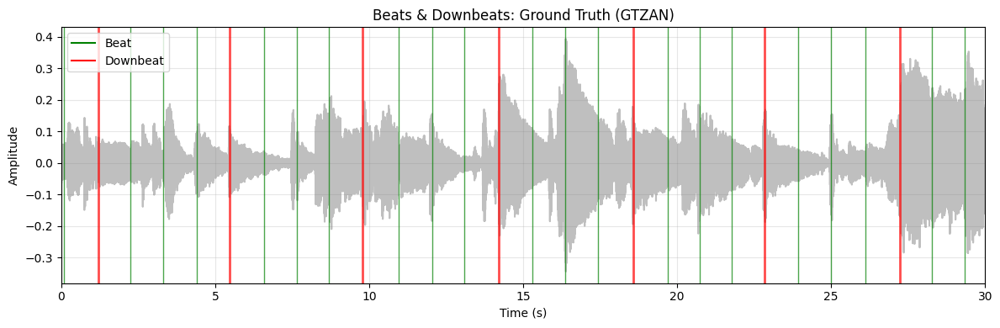

Ground Truth Sonification:


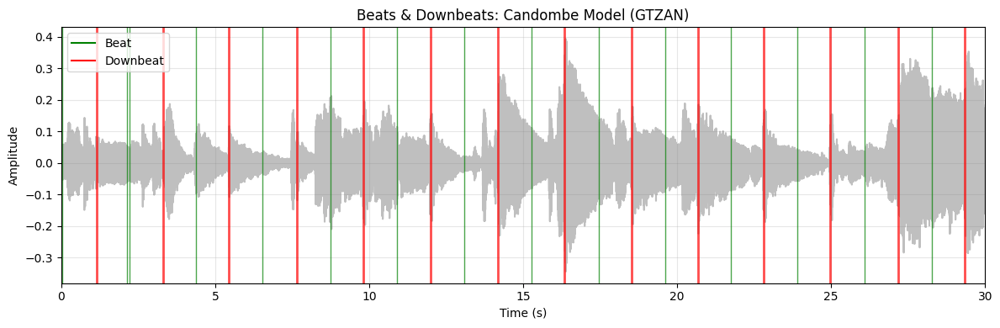

Candombe Model Sonification:


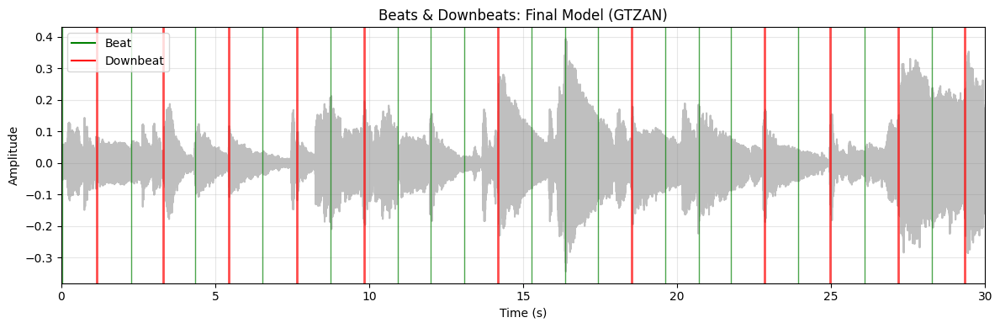

Final Model Sonification:


In [105]:
_ = process_song("gtzan_jazz_00089.beats", "gtzan", is_beats_file=True)


===== Analyzing GTZAN Dataset =====
Comparing Fine-tuned model to Beat this! model...

===== Comparison Summary =====
Total tracks analyzed: 993

CMLt_downbeat:
  Improved tracks: 88 (8.9%)
  Worsened tracks: 403 (40.6%)
  Unchanged tracks: 502 (50.6%)
  Average improvement: 0.2874
  Average deterioration: -0.4544

Overall:
  Improved tracks overall: 88 (8.9%)
  Worsened tracks overall: 403 (40.6%)
  Unchanged tracks overall: 502 (50.6%)

===== Top 5 Most Improved Tracks =====
1. gtzan/gtzan_country_00042/track.npy: 1.0000
   - CMLt_downbeat_diff: 1.0000
2. gtzan/gtzan_classical_00014/track.npy: 1.0000
   - CMLt_downbeat_diff: 1.0000
3. gtzan/gtzan_reggae_00064/track.npy: 1.0000
   - CMLt_downbeat_diff: 1.0000
4. gtzan/gtzan_country_00035/track.npy: 0.9524
   - CMLt_downbeat_diff: 0.9524
5. gtzan/gtzan_disco_00016/track.npy: 0.9091
   - CMLt_downbeat_diff: 0.9091

===== Top 5 Most Deteriorated Tracks =====
1. gtzan/gtzan_pop_00000/track.npy: -1.0000
   - CMLt_downbeat_diff: -1.0000
2.

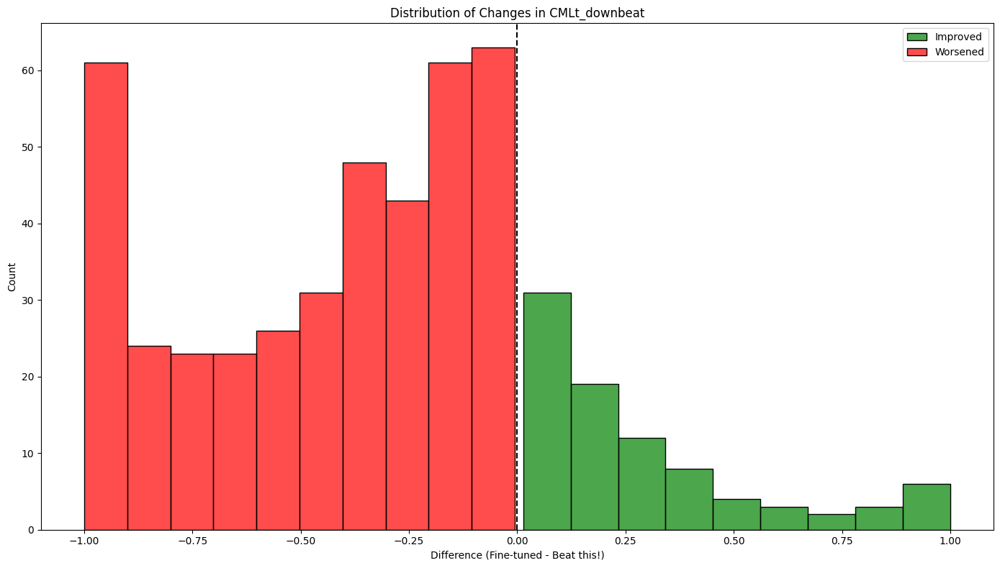

In [108]:
comparison_gtzan = run_analysis(dataset='gtzan', metrics=['CMLt_downbeat'])

In [104]:
comparison_gtzan[comparison_gtzan["overall_improved"] == False].sort_values("overall_diff")[200:250]
# len(comparison_gtzan[comparison_gtzan["overall_diff"] == -1])

,Piece,Dataset_Skip That,F-measure_beat_Skip That,Cemgil_beat_Skip That,CMLt_beat_Skip That,AMLt_beat_Skip That,F-measure_downbeat_Skip That,Cemgil_downbeat_Skip That,CMLt_downbeat_Skip That,AMLt_downbeat_Skip That,...,CMLt_downbeat_Final,AMLt_downbeat_Final,CMLt_downbeat_diff,CMLt_downbeat_improved,CMLt_downbeat_worsened,CMLt_downbeat_no_change,overall_diff,overall_improved,overall_worsened,overall_no_change
583,gtzan/gtzan_jazz_00089/track.npy,gtzan,1.000000,0.687153,1.000000,1.000000,0.666667,5.705148e-01,0.000000,0.916667,...,0.375000,0.454545,-0.375000,False,True,False,-0.375000,False,True,False
834,gtzan/gtzan_reggae_00040/track.npy,gtzan,0.385965,0.328705,0.153846,0.153846,0.240000,1.755552e-01,0.000000,0.058824,...,0.375000,0.375000,-0.375000,False,True,False,-0.375000,False,True,False
963,gtzan/gtzan_rock_00070/track.npy,gtzan,0.715596,0.803949,0.114286,0.820513,0.444444,4.856488e-01,0.000000,0.000000,...,0.375000,0.375000,-0.375000,False,True,False,-0.375000,False,True,False
215,gtzan/gtzan_country_00015/track.npy,gtzan,0.951613,0.833209,0.951613,0.951613,0.769231,6.742895e-01,0.347826,0.387097,...,0.722222,0.722222,-0.374396,False,True,False,-0.374396,False,True,False
981,gtzan/gtzan_rock_00088/track.npy,gtzan,1.000000,0.956605,1.000000,1.000000,0.833333,8.104065e-01,0.357143,0.473684,...,0.727273,0.727273,-0.370130,False,True,False,-0.370130,False,True,False
272,gtzan/gtzan_country_00072/track.npy,gtzan,1.000000,0.802195,1.000000,1.000000,0.914286,8.284410e-01,0.631579,0.631579,...,1.000000,1.000000,-0.368421,False,True,False,-0.368421,False,True,False
394,gtzan/gtzan_disco_00094/track.npy,gtzan,1.000000,0.957463,1.000000,1.000000,0.681818,7.874865e-01,0.000000,1.000000,...,0.368421,0.368421,-0.368421,False,True,False,-0.368421,False,True,False
116,gtzan/gtzan_classical_00016/track.npy,gtzan,0.928571,0.620538,0.952381,0.952381,0.577778,3.708276e-01,0.032258,0.032258,...,0.400000,0.400000,-0.367742,False,True,False,-0.367742,False,True,False
89,gtzan/gtzan_blues_00089/track.npy,gtzan,0.989011,0.849051,0.956522,0.956522,0.000000,2.926612e-37,0.000000,0.000000,...,0.363636,0.363636,-0.363636,False,True,False,-0.363636,False,True,False
563,gtzan/gtzan_jazz_00069/track.npy,gtzan,0.968750,0.818611,0.953125,0.953125,0.864865,7.257972e-01,0.523810,0.523810,...,0.882353,0.882353,-0.358543,False,True,False,-0.358543,False,True,False


In [ ]:
process_song("[0087] M2-39-SE.wav", plot=True, sonify=True)